In [46]:
import csv

site_names = {}
with open('sitepub_all_sj.csv', encoding='shift_jis') as csvfile: # 観測点情報CSVファイル
    reader = csv.reader(csvfile)
    for row in reader:
        site_names[row[0]] = f"{row[7]} {row[1]}" # 観測点コードをキーに、県と観測点名を保持する
print(site_names)

{'AIC001': '愛知県 尾西', 'AIC002': '愛知県 小牧', 'AIC003': '愛知県 津島', 'AIC004': '愛知県 名古屋', 'AIC005': '愛知県 藤岡', 'AIC006': '愛知県 稲武', 'AIC007': '愛知県 足助', 'AIC008': '愛知県 設楽', 'AIC009': '愛知県 豊田', 'AIC010': '愛知県 作手', 'AIC011': '愛知県 知多', 'AIC012': '愛知県 安城', 'AIC013': '愛知県 長篠', 'AIC014': '愛知県 蒲郡', 'AIC015': '愛知県 豊橋', 'AIC016': '愛知県 美浜', 'AIC017': '愛知県 田原', 'AIC018': '愛知県 渥美', 'AKT001': '秋田県 小坂', 'AKT002': '秋田県 大館', 'AKT003': '秋田県 藤里', 'AKT004': '秋田県 八森', 'AKT005': '秋田県 能代', 'AKT006': '秋田県 鹿角', 'AKT007': '秋田県 琴丘', 'AKT008': '秋田県 飯田川', 'AKT009': '秋田県 男鹿', 'AKT010': '秋田県 秋田', 'AKT011': '秋田県 宮田', 'AKT012': '秋田県 田沢湖', 'AKT013': '秋田県 協和', 'AKT014': '秋田県 角館', 'AKT015': '秋田県 本荘', 'AKT016': '秋田県 大曲', 'AKT017': '秋田県 横手', 'AKT018': '秋田県 鳥海', 'AKT019': '秋田県 雄勝', 'AKT020': '秋田県 象潟', 'AKT021': '秋田県 阿仁', 'AKT022': '秋田県 玉川', 'AKT023': '秋田県 椿台', 'AOM001': '青森県 大間', 'AOM002': '青森県 福浦', 'AOM003': '青森県 大畑', 'AOM004': '青森県 尻屋', 'AOM005': '青森県 むつ', 'AOM006': '青森県 川内', 'AOM007': '青森県 南通', 'AOM008': '青森県 横浜', 'AOM009': '青森県 六

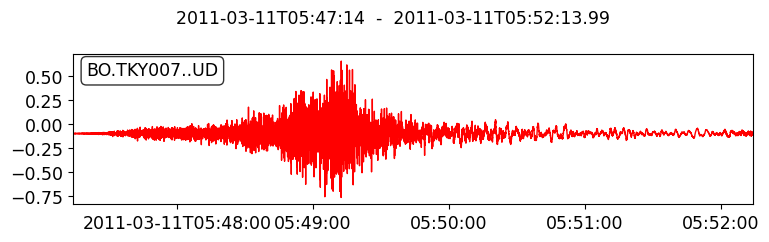

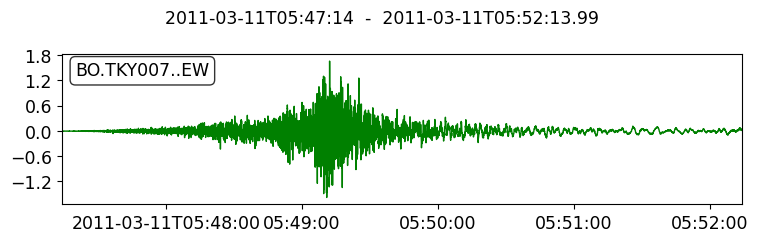

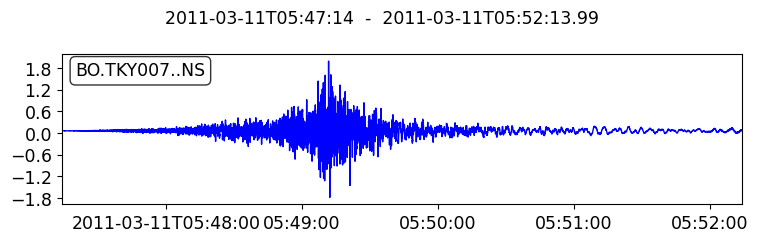

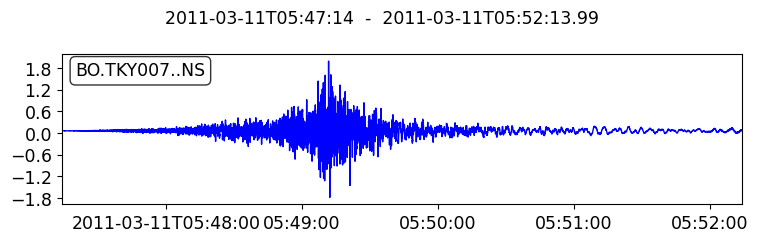

In [246]:
import obspy # conda install -c conda-forge obspy
import os, csv

site_names = {}
with open('sitepub_all_sj.csv', encoding='shift_jis') as csvfile: # 観測点情報CSVファイル
    reader = csv.reader(csvfile)
    for row in reader:
        site_names[row[0]] = f"{row[7]} {row[1]}" # 観測点コードをキーに、県と観測点名を保持

dir_path = "./20110311144600/20110311144600.knt"  # 強震データを展開したフォルダ
sites = [] # 全観測点の強震データを読み込む
for path in os.listdir(dir_path):
    file_name, ext = os.path.splitext(path)
    if ext == ".UD":
        ud = obspy.read(os.path.join(dir_path,file_name+'.UD'))[0]
        sites.append({
            'station':site_names[ud.stats.station], # 観測点名も格納しておく
            'UD':ud,
            'EW':obspy.read(os.path.join(dir_path,file_name+'.EW'))[0],
            'NS':obspy.read(os.path.join(dir_path,file_name+'.NS'))[0] })

site = next(filter(lambda site: site['UD'].stats.station=='TKY007', sites)) 
site['UD'].plot(color='red');site['EW'].plot(color='green');site['NS'].plot(color='blue')

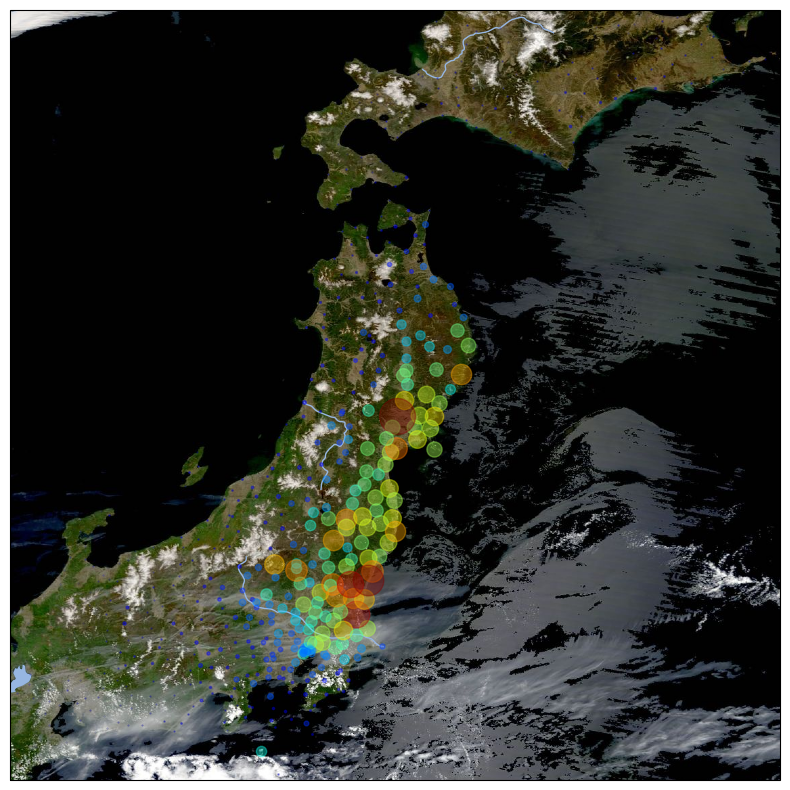

In [189]:
import matplotlib.pyplot as plt
plt.rcParams["font.size"] = 15

import matplotlib.pyplot as plt
import cartopy.crs as ccrs; import cartopy.feature as cfeature
from owslib.wmts import WebMapTileService; import math

def create_fig_for_map(fig_size): # 日本地図を描く前処理を行う関数
    fig=plt.figure(figsize=fig_size); ax=plt.axes(projection=ccrs.PlateCarree())
    ax.set_extent((136.0,146.0,34.0,44.0),ccrs.PlateCarree())
    ax.add_feature(cfeature.OCEAN);ax.add_feature(cfeature.LAND)
    ax.add_feature(cfeature.LAKES);ax.add_feature(cfeature.RIVERS)
    ax.add_feature(cfeature.BORDERS)
    ax.add_wmts(wmts,'MODIS_Terra_SurfaceReflectance_Bands143', 
            wmts_kwargs={'time': '2019-05-05'}); cm = plt.get_cmap("jet")
    return ax

ax = create_fig_for_map((10,10))
for site in sites:                # 全観測点の最大加速度をプロットしてみる
    lon = site['UD'].stats.knet.stlo; lat = site['UD'].stats.knet.stla # 東経と北緯
    accmax = math.log10(site['UD'].stats.knet.accmax / 100.0+1 )
    ax.plot(lon,lat,'o',color = cm(accmax),markersize=str(accmax*20),alpha=0.4)
plt.show()

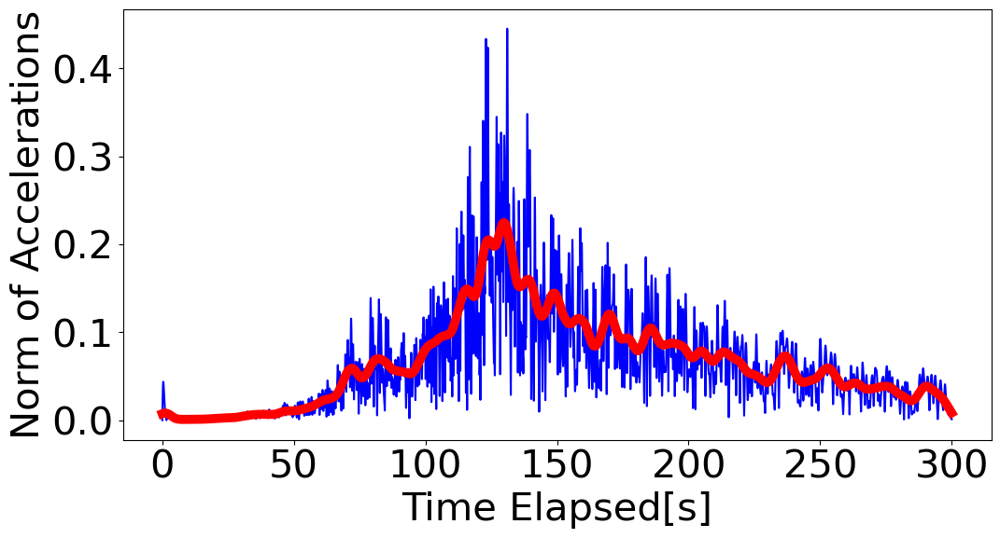

In [250]:
import numpy as np
from scipy import signal

def bandpass_acc(site): # 3方向加速度にバンドフィルタを掛けた結果を返す
    return {
  'UD':site['UD'].copy().filter('bandpass',freqmin=0.2,freqmax=1,corners=2,zerophase=True),
  'NS':site['NS'].copy().filter('bandpass',freqmin=0.2,freqmax=1,corners=2,zerophase=True),
  'EW':site['EW'].copy().filter('bandpass',freqmin=0.2,freqmax=1,corners=2,zerophase=True)}

def calc_acc_norm_list(site): # 3加速度のノルムをとる
    norm=[]
    for i in range(len(site['UD'].data)):
        norm.append(np.linalg.norm(np.array([
    (site['EW'].data[i]-site['EW'].data[0])*site['EW'].stats.calib,
    (site['NS'].data[i]-site['NS'].data[0])*site['NS'].stats.calib,
    (site['UD'].data[i]-site['UD'].data[0])*site['UD'].stats.calib ])))
    return np.array(norm)

def acc_norm_list2envelop(acc_norm_list): # 「揺れの大きさ」を滑らかにする
    win = signal.windows.hann(1000)
    return signal.convolve(acc_norm_list,win,mode='same')/sum(win)

def site2acc_norm_list_filtered(site):
    bp_site = bandpass_acc(site)
    acc_norm_list = calc_acc_norm_list(bp_site)
    acc_norm_list_filtered = acc_norm_list2envelop(acc_norm_list)
    return (acc_norm_list, acc_norm_list_filtered)

# 観測点コード TKY007＝東京新宿にある観測点の強震データに対して処理をしてみる
site=next(filter(lambda site: site['UD'].stats.station=='TKY007',sites)) 
acc_norm_list,acc_norm_list_filtered = site2acc_norm_list_filtered(site)
t = np.arange(0, site['UD'].stats.npts / site['UD'].stats.sampling_rate,
              1 / site['UD'].stats.sampling_rate)
fig, ax = plt.subplots(figsize=(12, 6)); plt.rcParams["font.size"]=30
ax.plot(t,acc_norm_list,'b');ax.plot(t,acc_norm_list_filtered,'r',linewidth=7)
ax.set_ylabel('Norm of Accelerations'); ax.set_xlabel('Time Elapsed[s]')
plt.show()

#plt.xlim(80, 90)
#plt.show()

In [135]:
s_max = 500 # 何秒後まで描くか
acc_2d_map = np.zeros((len(sites),  s_max))
for idx, sitename_accmax in enumerate(sitenames_accmaxs):
    site=next(filter(lambda site: site['UD'].stats.station==sitename_accmax[0],sites))
    acc_norm_list,acc_norm_list_filtered = site2acc_norm_list_filtered(site)
    for sec in np.arange(s_max):
        corrected_sec = sec-(site['UD'].stats.starttime.timestamp-start_time-15)
        s = int(corrected_sec*site['UD'].stats.sampling_rate)
        if 0<=s and s<len(acc_norm_list_filtered):# データ範囲外では値は0のまま
            acc_2d_map[idx][sec] = acc_norm_list_filtered[s]
plt.imshow(np.vectorize(math.log10)(acc_2d_map*500+1),cmap='jet',aspect=0.4)

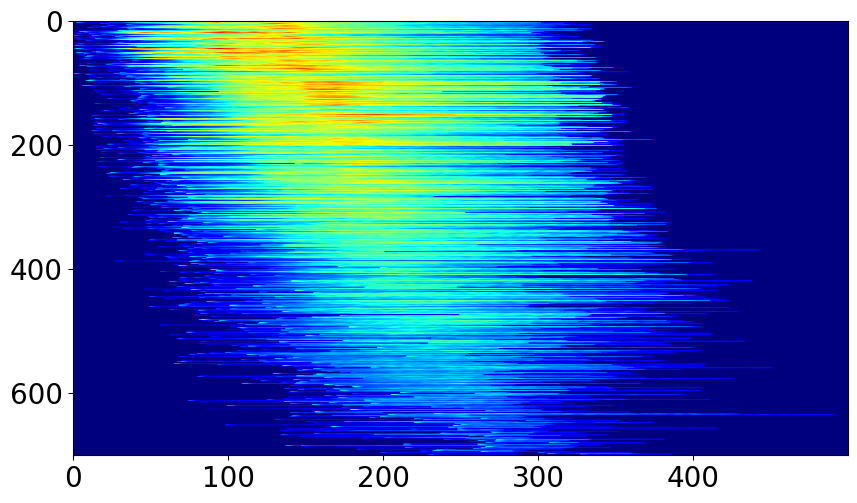

In [273]:
plt.rcParams["font.size"] = 20; fig,ax = plt.subplots(figsize=(10, 12))
plt.imshow(np.vectorize(math.log10)(acc_2d_map*500+1),cmap='jet',aspect=0.4)

In [219]:
def draw_accnorm_map(acc_2d_map, sec=0):
    ax = create_fig_for_map((5,5))
    for idx, sitename_accmax in enumerate(sitenames_accmaxs):
        site = next(filter(lambda site:site['UD'].stats.station==sitename_accmax[0],sites))
        lon = site['UD'].stats.knet.stlo;lat = site['UD'].stats.knet.stla # 東経、北緯
        acc = acc_2d_map[idx][sec]
        ax.plot(lon,lat,'o',color=cm(acc),markersize=str(acc*20), alpha=0.4)
    plt.show()

draw_accnorm_map(np.vectorize(math.log10)(acc_2d_map*10+1),sec=50)

In [216]:
acc_2d_map_ = np.vectorize(math.log10)(acc_2d_map*10+1)

------ 0 ------


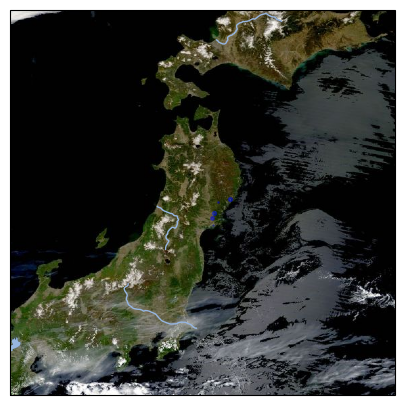

------ 10 ------


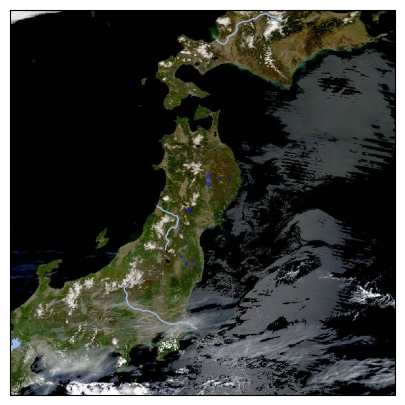

------ 20 ------


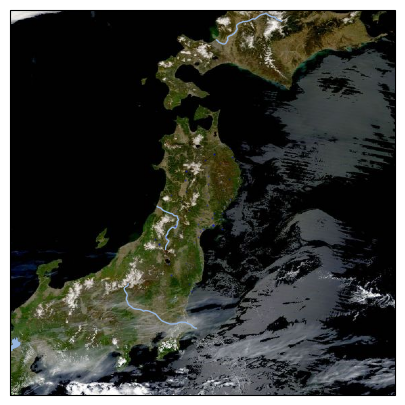

------ 30 ------


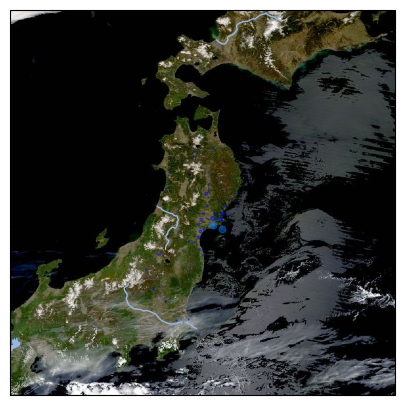

------ 40 ------


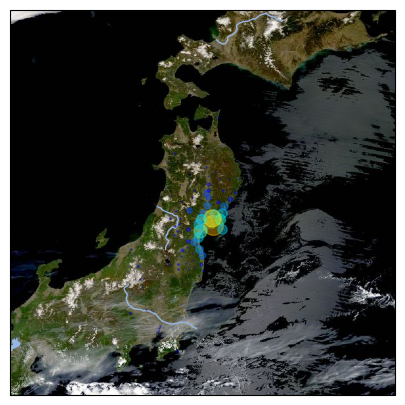

------ 50 ------


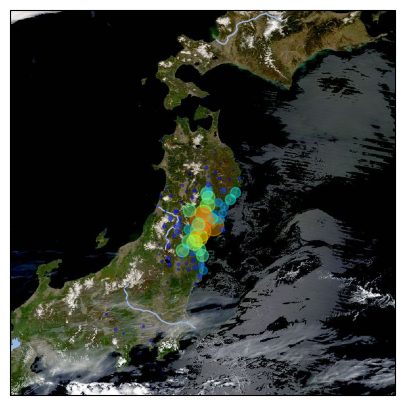

------ 60 ------


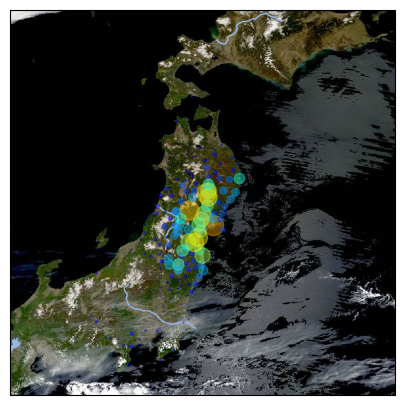

------ 70 ------


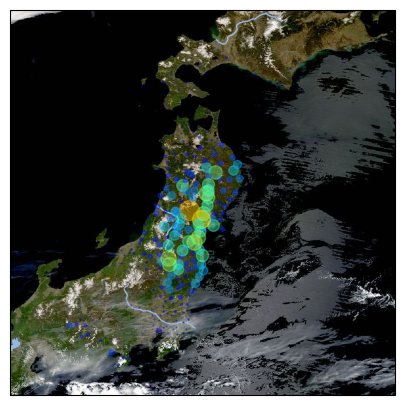

------ 80 ------


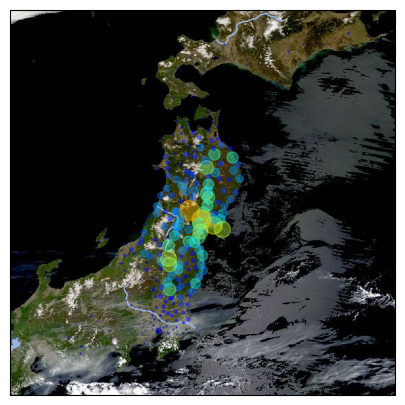

------ 90 ------


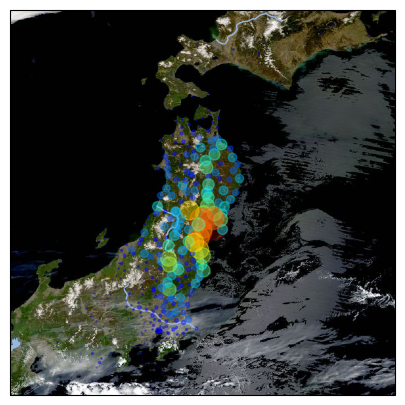

------ 100 ------


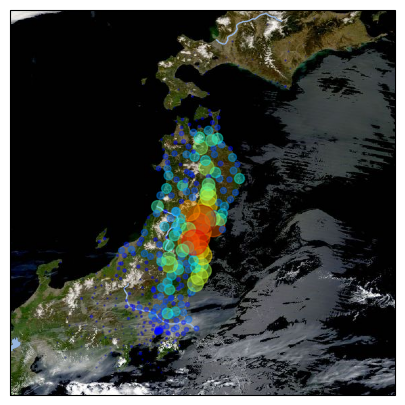

------ 110 ------


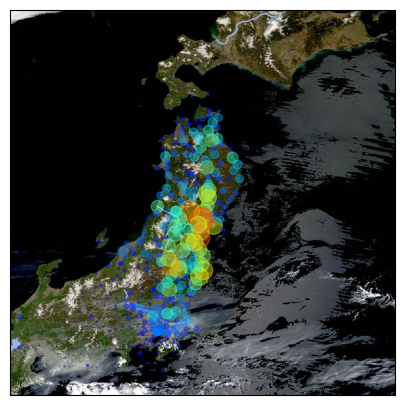

------ 120 ------


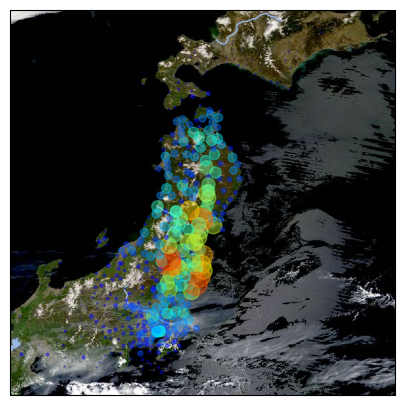

------ 130 ------


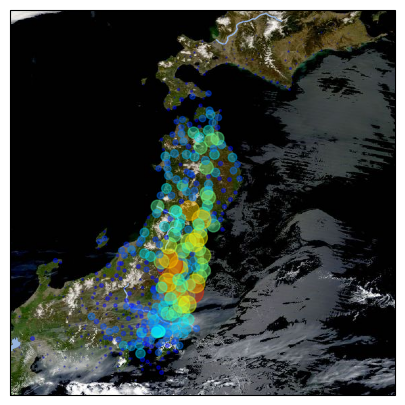

------ 140 ------


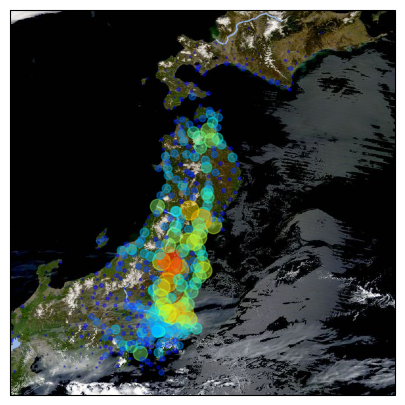

------ 150 ------


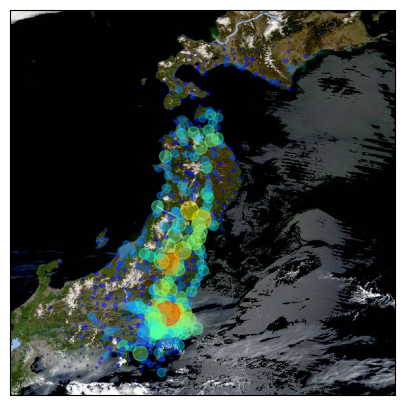

------ 160 ------


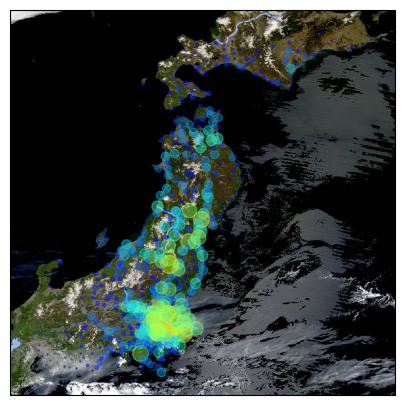

------ 170 ------


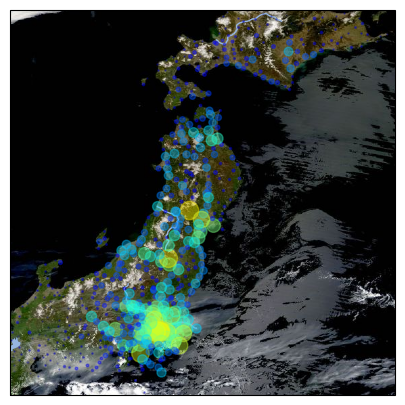

------ 180 ------


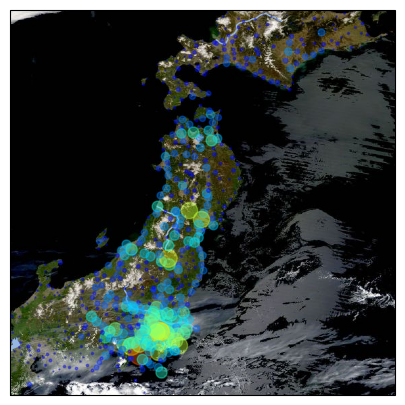

------ 190 ------


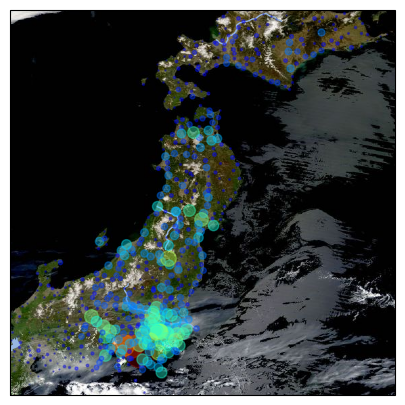

------ 200 ------


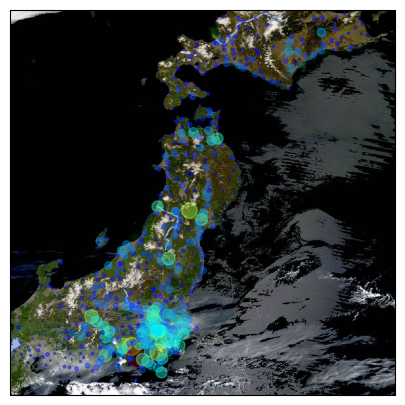

------ 210 ------


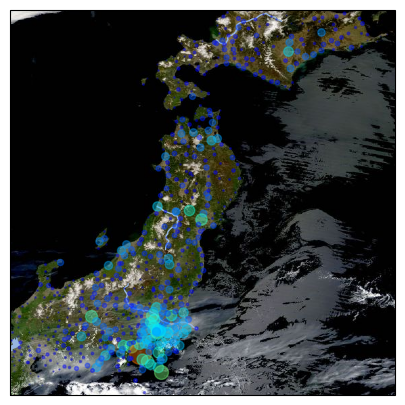

------ 220 ------


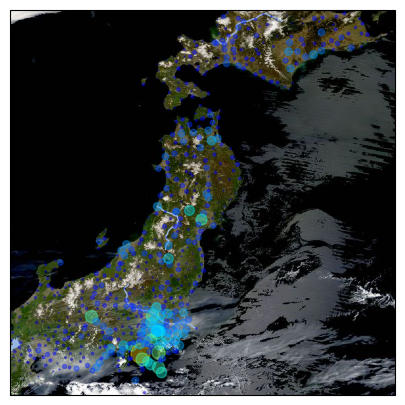

------ 230 ------


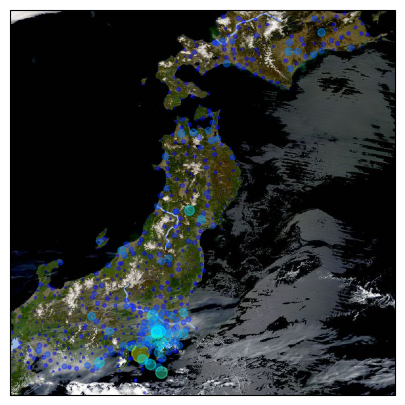

------ 240 ------


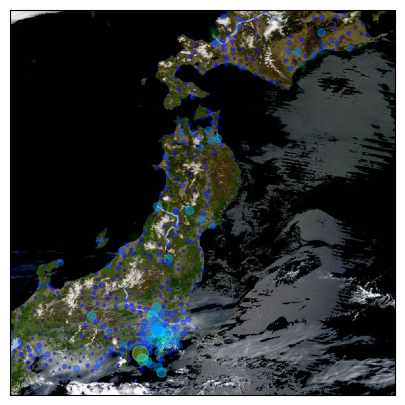

------ 250 ------


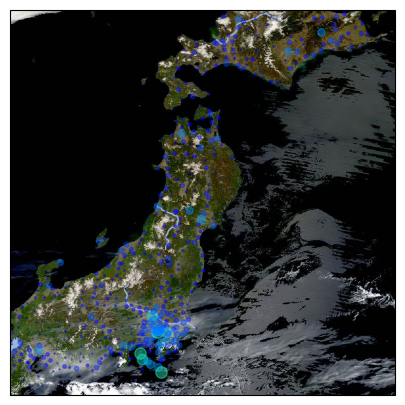

------ 260 ------


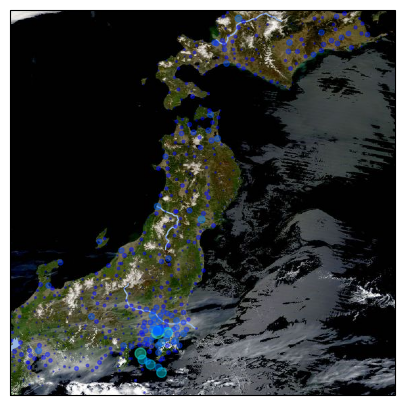

------ 270 ------


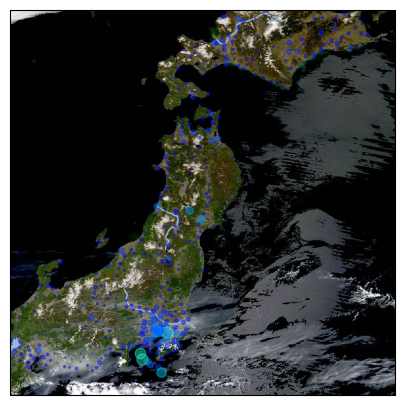

------ 280 ------


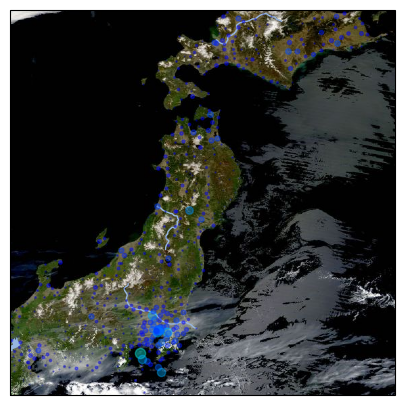

------ 290 ------


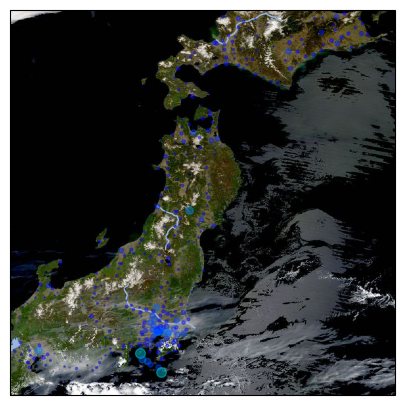

------ 300 ------


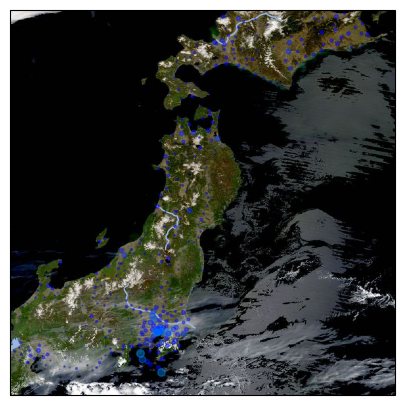

------ 310 ------


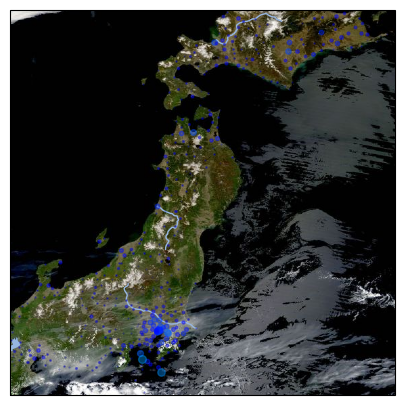

------ 320 ------


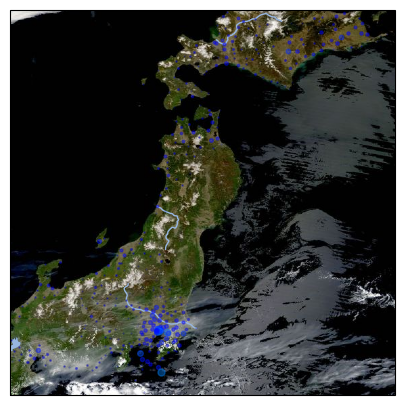

------ 330 ------


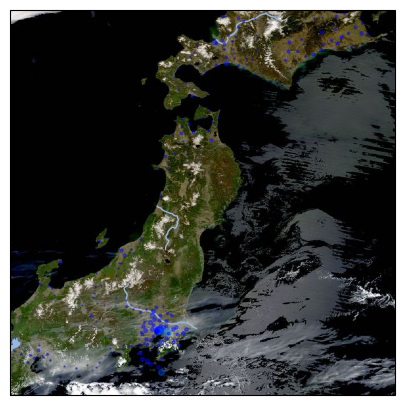

------ 340 ------


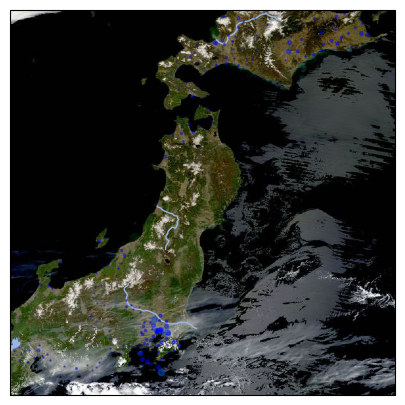

------ 350 ------


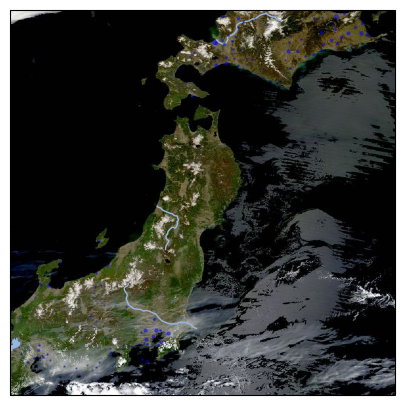

------ 360 ------


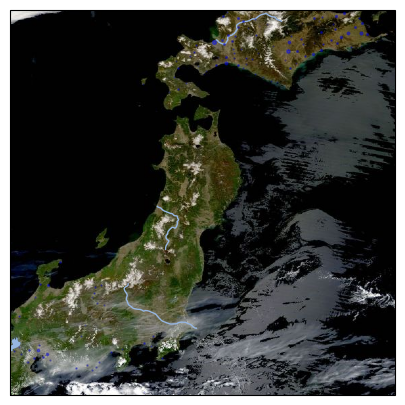

------ 370 ------


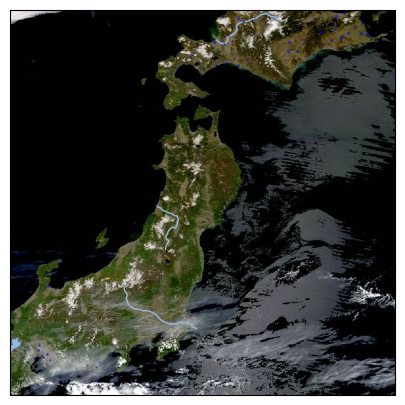

------ 380 ------


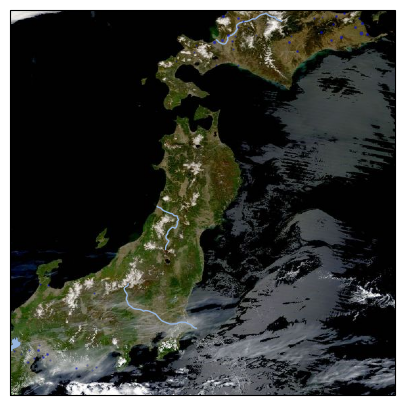

------ 390 ------


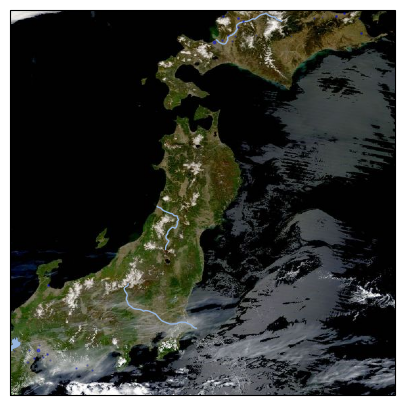

In [221]:
for s in range(0,400,10):
    print('------',s,'------')
    draw_accnorm_map(acc_2d_map_, sec=s)